# RNN 
- 2 Entradas PwmD, PwmE
- 3 Saidas Theta, X e Y
- 1 Camada
- n neurônios
## Resultados
- R² test Theta: -0.232
- R² test Y: 0.12 
- R² test X: 0.098

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

Datasets = []
PREDICTORS = ["PwmD", "PwmE"]   
TARGET = ["Theta", "X", "Y"]       
TIME_STEPS = 7

for i in range(3):   
    Dataset = pd.read_csv(f"../Dados/Data{i + 1}.csv")
        
    # Ajusta índice pelo tempo
    Dataset.index = (np.arange(0, len(Dataset), 1).astype(float) * 0.07).round(5)
    
    Datasets.append(Dataset)
    
    print(f"++++++++++++++++++++ Dataset {i+1} +++++++++++++++++++++++")
    print(Dataset.head(5))


++++++++++++++++++++ Dataset 1 +++++++++++++++++++++++
        X    Y  Theta    Wd   We  WdRef  WeRef   PwmD   PwmE
0.00  0.0  0.7   0.00  0.00  0.0  -0.00   0.00  -0.00   0.00
0.07  0.0  0.7   0.00  0.00  0.0   3.02   3.02  -0.00   0.00
0.14  0.0  0.7   0.00  0.00  0.0   3.02   3.02  45.32  45.32
0.21  0.0  0.7   0.01  0.36  0.0   3.02   3.02  45.32  45.32
0.28  0.0  0.7   0.01  0.20  0.0   2.99   3.02  57.60  63.38
++++++++++++++++++++ Dataset 2 +++++++++++++++++++++++
        X    Y  Theta    Wd   We  WdRef  WeRef   PwmD   PwmE
0.00  0.0  0.7    0.0  0.00  0.0  -0.00   0.00  -0.00   0.00
0.07  0.0  0.7    0.0  0.00  0.0   3.02   3.02  -0.00   0.00
0.14  0.0  0.7    0.0  0.00  0.0   3.02   3.02  45.32  45.32
0.21  0.0  0.7    0.0  0.03  0.0   3.02   3.02  45.32  45.32
0.28  0.0  0.7    0.0  0.00  0.0   3.02   3.02  63.00  63.44
++++++++++++++++++++ Dataset 3 +++++++++++++++++++++++
        X    Y  Theta   Wd   We  WdRef  WeRef   PwmD   PwmE
0.00  0.0  0.7    0.0  0.0  0.0  -0.00   0.

In [2]:
NormDatasets = []

SCALER = StandardScaler()
OUT_SCALER = StandardScaler()

TrainDataset = Datasets[0]
TrainDataset[PREDICTORS] = SCALER.fit_transform(TrainDataset[PREDICTORS])
TrainDataset[TARGET] = OUT_SCALER.fit_transform(TrainDataset[TARGET])
NormDatasets.append(TrainDataset)

for i in range(2):
      CurrentTestDataset = Datasets[i + 1]
      CurrentTestDataset[PREDICTORS] = SCALER.transform(CurrentTestDataset[PREDICTORS])
      CurrentTestDataset[TARGET] = OUT_SCALER.transform(CurrentTestDataset[TARGET])
      NormDatasets.append(CurrentTestDataset)
      print(f"++++++++++++++++++++ Dataset Normalizado {i+1} +++++++++++++++++++++++")
      print(NormDatasets[i].head(5))

++++++++++++++++++++ Dataset Normalizado 1 +++++++++++++++++++++++
             X         Y     Theta    Wd   We  WdRef  WeRef      PwmD  \
0.00 -1.709302  1.484089 -0.359558  0.00  0.0  -0.00   0.00  0.464323   
0.07 -1.709302  1.484089 -0.359558  0.00  0.0   3.02   3.02  0.464323   
0.14 -1.709302  1.484089 -0.359558  0.00  0.0   3.02   3.02  1.082441   
0.21 -1.709302  1.484089 -0.342096  0.36  0.0   3.02   3.02  1.082441   
0.28 -1.709302  1.484089 -0.342096  0.20  0.0   2.99   3.02  1.249928   

          PwmE  
0.00  0.399504  
0.07  0.399504  
0.14  0.887533  
0.21  0.887533  
0.28  1.082012  
++++++++++++++++++++ Dataset Normalizado 2 +++++++++++++++++++++++
             X         Y     Theta    Wd   We  WdRef  WeRef      PwmD  \
0.00 -1.709302  1.484089 -0.359558  0.00  0.0  -0.00   0.00  0.464323   
0.07 -1.709302  1.484089 -0.359558  0.00  0.0   3.02   3.02  0.464323   
0.14 -1.709302  1.484089 -0.359558  0.00  0.0   3.02   3.02  1.082441   
0.21 -1.709302  1.484089 -0.35955

In [3]:
def CreateSequences(input_data, target_data, timesteps):
    X_seq, Y_seq = [], []
    
    for i in range(timesteps, len(input_data)):
        X_seq.append(input_data.iloc[i-timesteps:i].values)
        Y_seq.append(target_data.iloc[i])
    return np.array(X_seq), np.array(Y_seq)

In [4]:
x_train = TrainDataset[PREDICTORS]
y_train = TrainDataset[TARGET]

x_train, y_train = CreateSequences(x_train, y_train, TIME_STEPS)

x_val = (NormDatasets[1])[PREDICTORS]
y_val = (NormDatasets[1])[TARGET]

x_val, y_val = CreateSequences(x_val, y_val, TIME_STEPS)


print(f"Dimensão da entrada: {np.shape(x_train)}")
print(f"Dimensão da saida: {np.shape(y_train)}")

Dimensão da entrada: (1414, 7, 2)
Dimensão da saida: (1414, 3)


In [5]:
import matplotlib.pyplot as plt

def PlotHistory(history):
    plt.figure(figsize=(8, 5))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('MSE Loss')
    plt.title('Training History')
    plt.legend()
    plt.grid(True)
    plt.show()
    

In [6]:
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

TITLES = ["train", "val", "test"]

def PlotOut(ax, title, target_name, y_true, y_pred):
    time = (np.arange(0, len(y_pred), 1).astype(float) * 0.07).round(5)

    ax.scatter(time, y_true, marker='o', s=12, label='Amostras Reais', alpha=0.7)
    ax.scatter(time, y_pred, marker='x', s=12, label='Valores Preditos', alpha=0.7)
    ax.set_title(f'{title} - {target_name}')
    ax.set_xlabel('Tempo [s]')
    ax.set_ylabel(target_name)
    ax.legend()
    ax.grid(True)


def EvalModel(model):
    n_datasets = len(Datasets)
    n_targets = len(TARGET)
    fig, axs = plt.subplots(n_datasets, n_targets, figsize=(6 * n_targets, 4 * n_datasets))
    
    metrics = {name: {"R2_train": [], "R2_test": [], "R2_val": [],
                      "MSE_train": [], "MSE_test": [], "MSE_val": [],} for name in TARGET}

    for i, dataset in enumerate(NormDatasets):
        x = dataset[PREDICTORS]
        y = dataset[TARGET]
        x, y = CreateSequences(x, y, TIME_STEPS)

        y_pred = OUT_SCALER.inverse_transform(model.predict(x))
        y_true = OUT_SCALER.inverse_transform(y)

        # Calcula métricas por saída
        for j, name in enumerate(TARGET):
            r2 = r2_score(y_true[:, j], y_pred[:, j])
            mse = mean_squared_error(y_true[:, j], y_pred[:, j])
            metrics[name][f"R2_{TITLES[i]}"].append(r2)
            metrics[name][f"MSE_{TITLES[i]}"].append(mse)

            print(f"{name} | {TITLES[i]} -> R² = {r2:.4f}, MSE = {mse:.4e}")
            
            # Seleciona o eixo correto (funciona mesmo com 1x1, 1x2 ou 3x2)
            ax = axs[i][j] if n_datasets > 1 and n_targets > 1 else (
                axs[j] if n_targets > 1 else axs[i] if n_datasets > 1 else axs
            )
            PlotOut(ax, TITLES[i], name, y_true[:, j], y_pred[:, j])

    plt.tight_layout()
    plt.show()

    # Retorna métricas médias para análise posterior
    return metrics

45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Theta | train -> R² = 0.0317, MSE = 3.1893e-01
X | train -> R² = 0.0297, MSE = 8.8902e-02
Y | train -> R² = 0.0646, MSE = 7.1656e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0315, MSE = 3.1758e-01
X | val -> R² = -0.0109, MSE = 9.6223e-02
Y | val -> R² = 0.0662, MSE = 6.9358e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0812, MSE = 3.1016e-01
X | test -> R² = -0.0038, MSE = 1.0147e-01
Y | test -> R² = 0.0525, MSE = 7.5296e-02


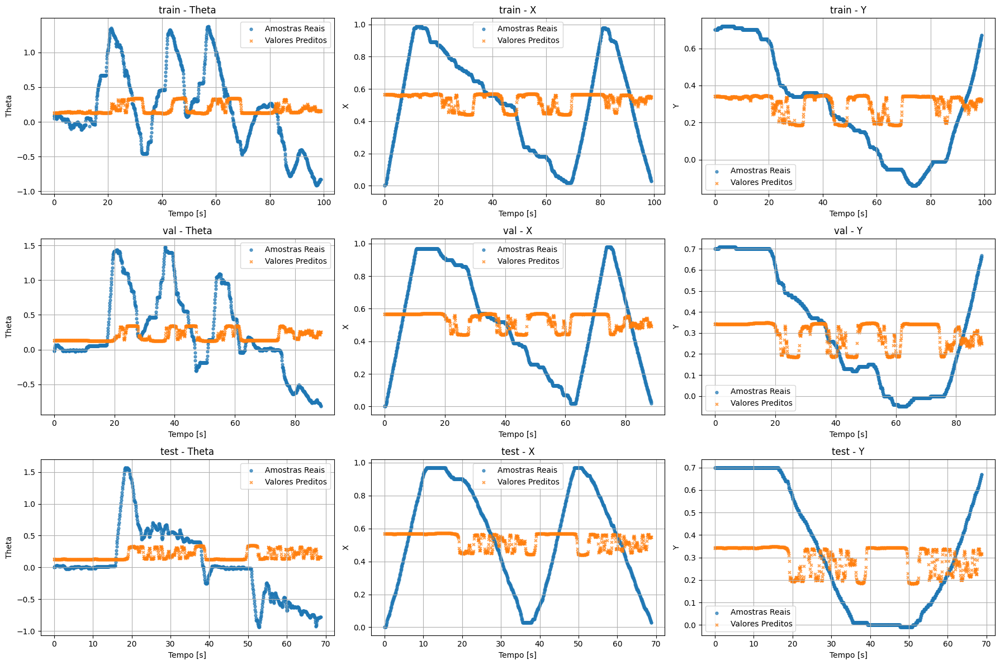

Modelo 0 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
Theta | train -> R² = 0.0424, MSE = 3.1540e-01
X | train -> R² = 0.0251, MSE = 8.9319e-02
Y | train -> R² = 0.0727, MSE = 7.1035e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.0568, MSE = 3.0930e-01
X | val -> R² = -0.0288, MSE = 9.7933e-02
Y | val -> R² = 0.0605, MSE = 6.9780e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.1201, MSE = 3.2134e-01
X | test -> R² = -0.0276, MSE = 1.0389e-01
Y | test -> R² = 0.0204, MSE = 7.7851e-02


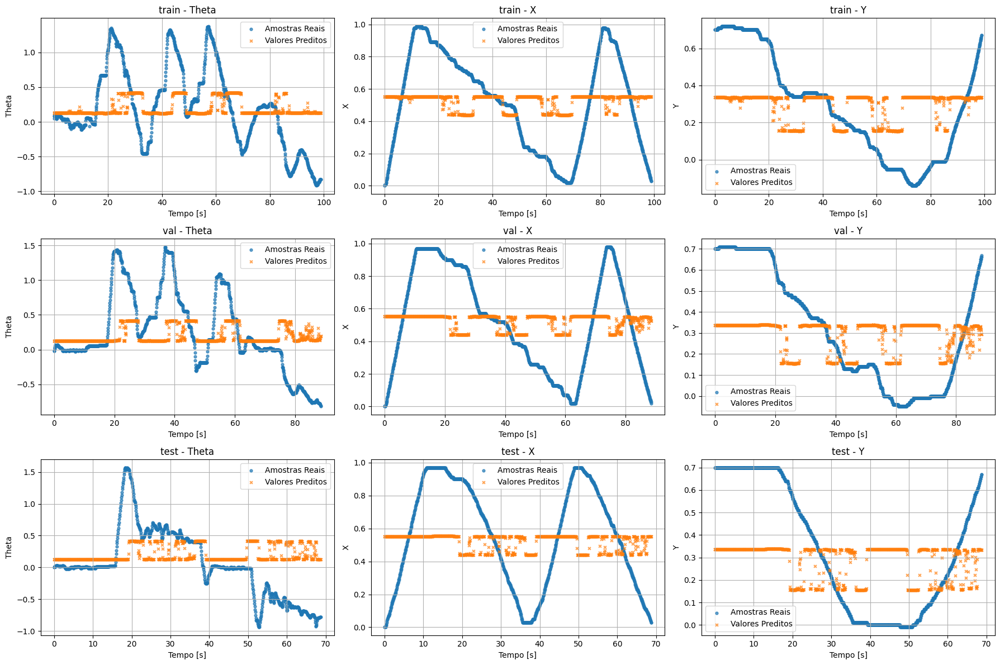

Modelo 1 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
Theta | train -> R² = 0.0440, MSE = 3.1489e-01
X | train -> R² = 0.0031, MSE = 9.1337e-02
Y | train -> R² = 0.0000, MSE = 7.6607e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.0491, MSE = 3.1181e-01
X | val -> R² = -0.0033, MSE = 9.5503e-02
Y | val -> R² = -0.0104, MSE = 7.5049e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0807, MSE = 3.1003e-01
X | test -> R² = -0.0039, MSE = 1.0148e-01
Y | test -> R² = -0.0305, MSE = 8.1890e-02


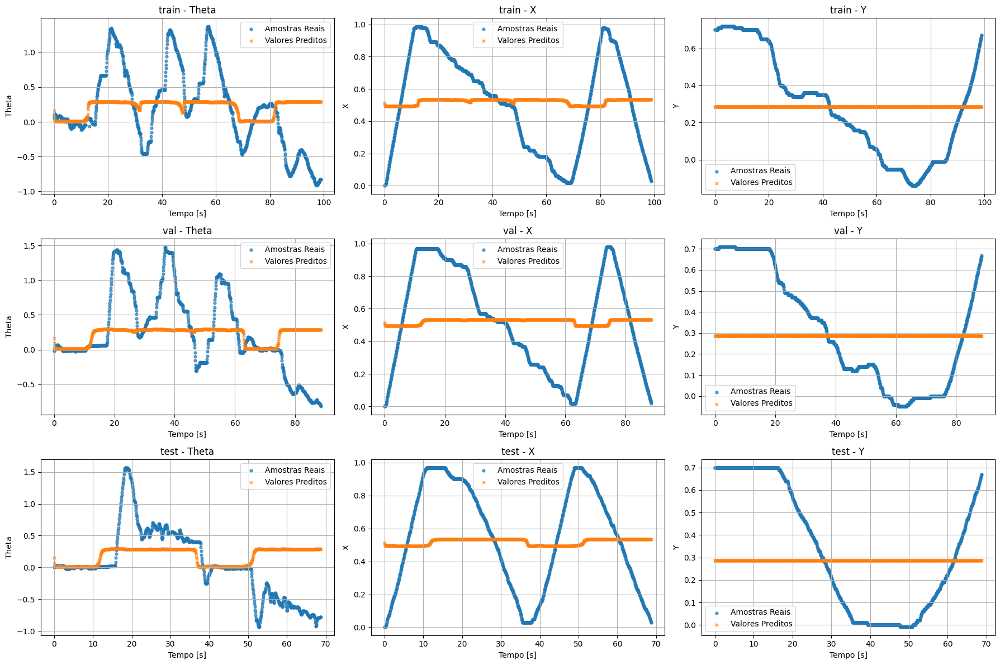

Modelo 2 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
Theta | train -> R² = 0.0572, MSE = 3.1054e-01
X | train -> R² = 0.0001, MSE = 9.1613e-02
Y | train -> R² = 0.0004, MSE = 7.6574e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.0770, MSE = 3.0266e-01
X | val -> R² = -0.0023, MSE = 9.5404e-02
Y | val -> R² = 0.0027, MSE = 7.4074e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0762, MSE = 3.0873e-01
X | test -> R² = -0.0140, MSE = 1.0251e-01
Y | test -> R² = -0.0248, MSE = 8.1437e-02


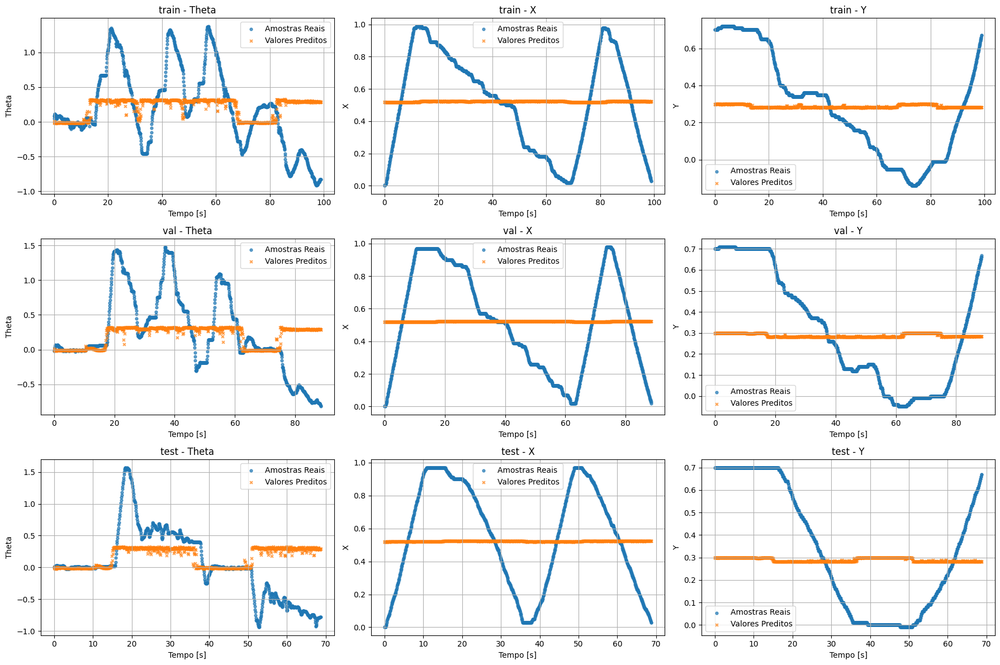

Modelo 3 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
Theta | train -> R² = 0.0531, MSE = 3.1186e-01
X | train -> R² = 0.0002, MSE = 9.1604e-02
Y | train -> R² = 0.0011, MSE = 7.6520e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0615, MSE = 3.0774e-01
X | val -> R² = 0.0063, MSE = 9.4590e-02
Y | val -> R² = 0.0108, MSE = 7.3472e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0861, MSE = 3.1157e-01
X | test -> R² = -0.0130, MSE = 1.0241e-01
Y | test -> R² = -0.0165, MSE = 8.0779e-02


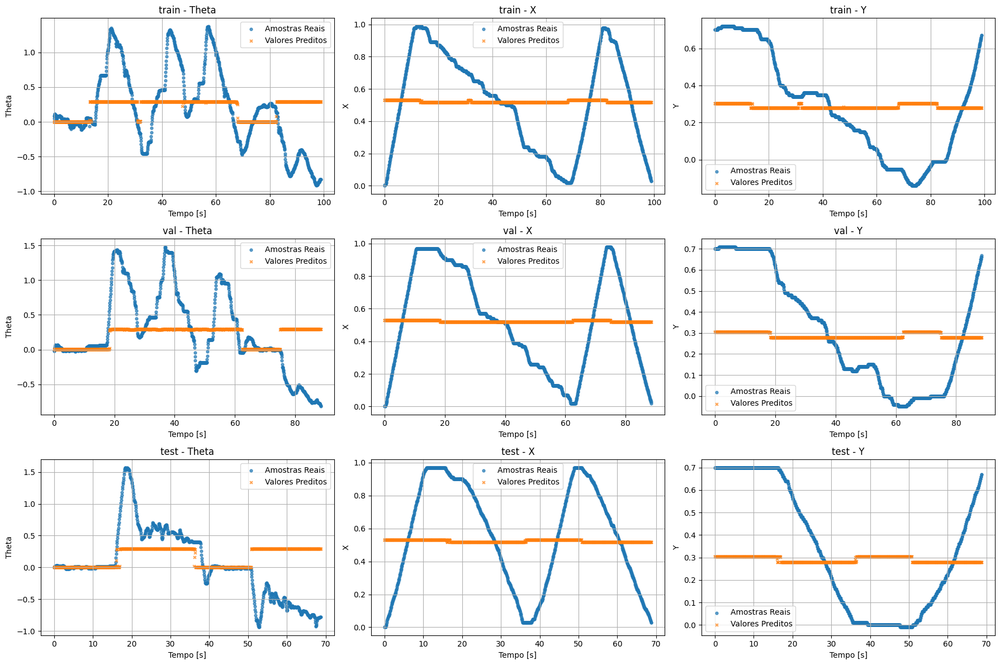

Modelo 4 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
Theta | train -> R² = 0.0203, MSE = 3.2267e-01
X | train -> R² = 0.0215, MSE = 8.9651e-02
Y | train -> R² = 0.0391, MSE = 7.3608e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = -0.0009, MSE = 3.2822e-01
X | val -> R² = 0.0266, MSE = 9.2651e-02
Y | val -> R² = 0.0434, MSE = 7.1053e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0462, MSE = 3.0013e-01
X | test -> R² = 0.0551, MSE = 9.5517e-02
Y | test -> R² = 0.0439, MSE = 7.5981e-02


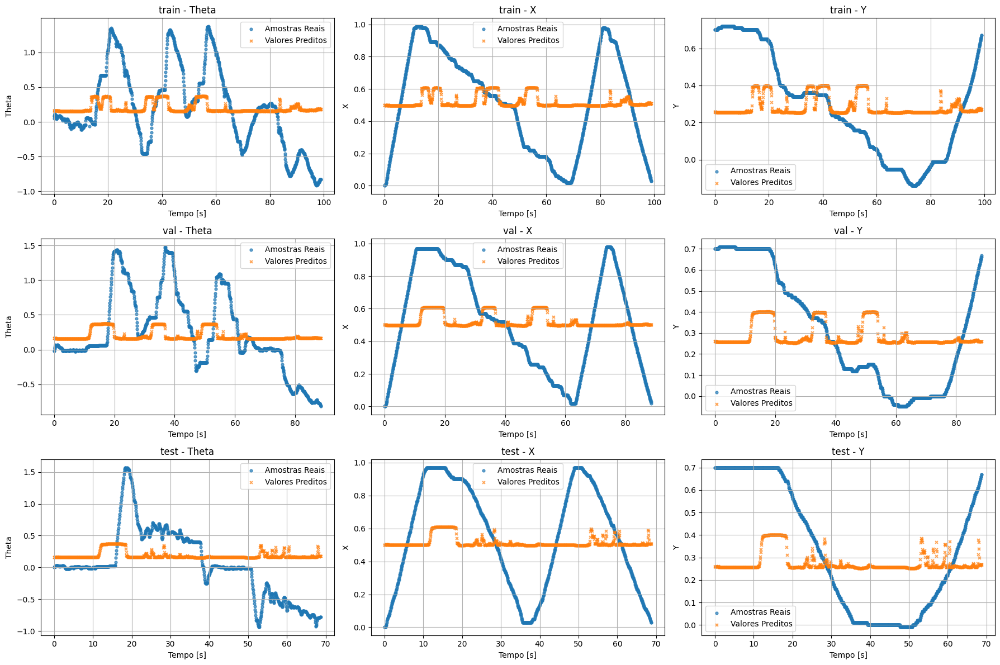

Modelo 5 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Theta | train -> R² = 0.0411, MSE = 3.1584e-01
X | train -> R² = 0.0067, MSE = 9.1011e-02
Y | train -> R² = 0.0005, MSE = 7.6571e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0425, MSE = 3.1399e-01
X | val -> R² = -0.0040, MSE = 9.5570e-02
Y | val -> R² = -0.0138, MSE = 7.5296e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0801, MSE = 3.0984e-01
X | test -> R² = -0.0004, MSE = 1.0113e-01
Y | test -> R² = -0.0267, MSE = 8.1596e-02


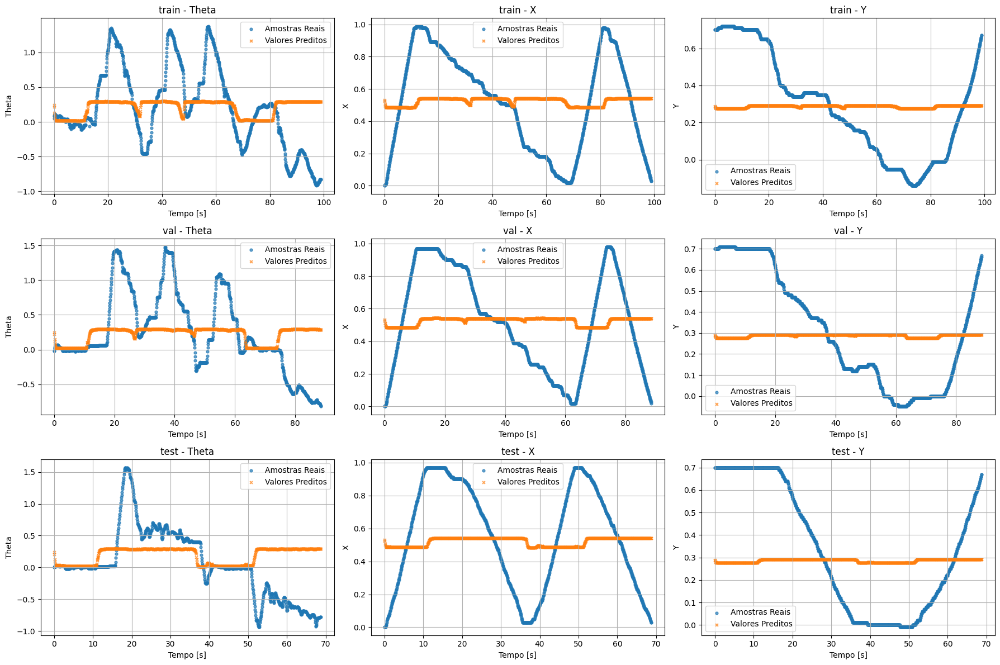

Modelo 6 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Theta | train -> R² = 0.0552, MSE = 3.1118e-01
X | train -> R² = 0.0001, MSE = 9.1614e-02
Y | train -> R² = 0.0007, MSE = 7.6555e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0733, MSE = 3.0386e-01
X | val -> R² = -0.0025, MSE = 9.5422e-02
Y | val -> R² = 0.0021, MSE = 7.4117e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0759, MSE = 3.0863e-01
X | test -> R² = -0.0137, MSE = 1.0247e-01
Y | test -> R² = -0.0271, MSE = 8.1627e-02


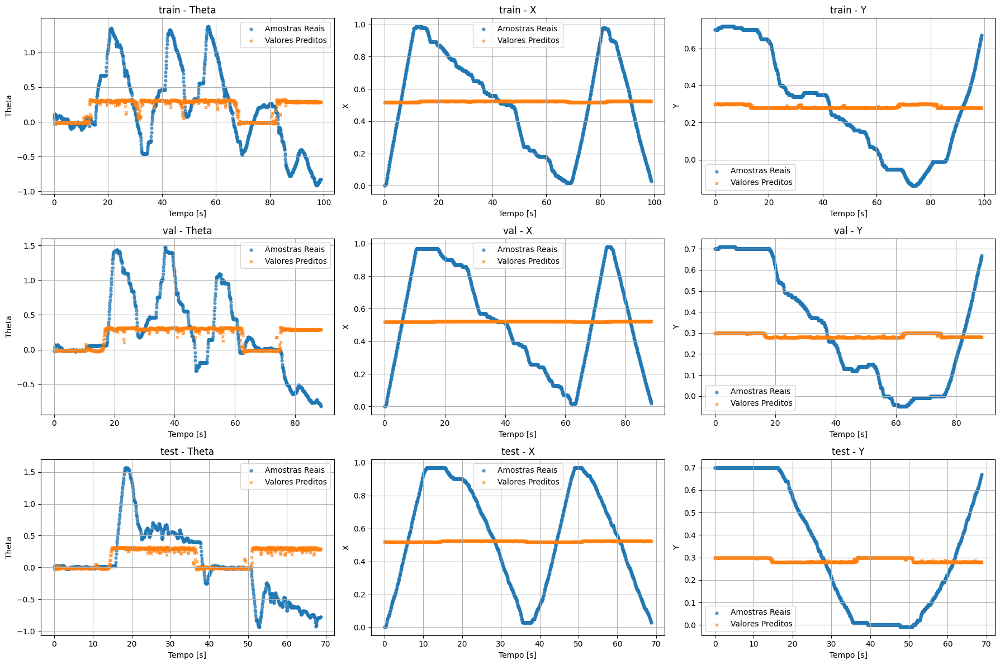

Modelo 7 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Theta | train -> R² = 0.0315, MSE = 3.1900e-01
X | train -> R² = 0.0165, MSE = 9.0108e-02
Y | train -> R² = 0.0341, MSE = 7.3995e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0004, MSE = 3.2779e-01
X | val -> R² = 0.0255, MSE = 9.2765e-02
Y | val -> R² = 0.0444, MSE = 7.0973e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0377, MSE = 2.9768e-01
X | test -> R² = 0.0502, MSE = 9.6022e-02
Y | test -> R² = 0.0493, MSE = 7.5556e-02


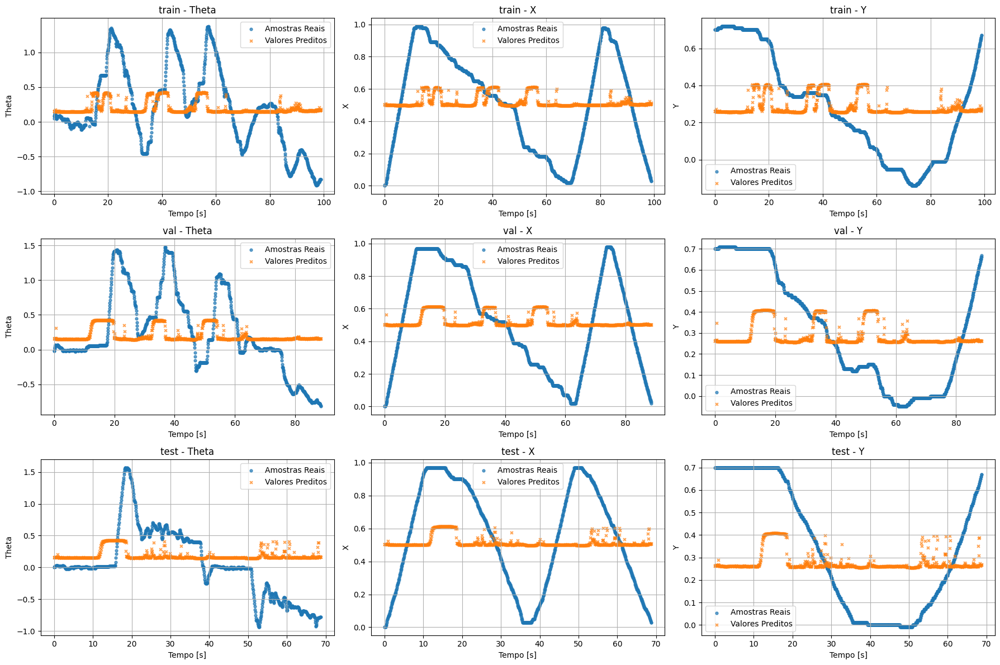

Modelo 8 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Theta | train -> R² = 0.0573, MSE = 3.1048e-01
X | train -> R² = 0.0001, MSE = 9.1612e-02
Y | train -> R² = 0.0004, MSE = 7.6573e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0764, MSE = 3.0287e-01
X | val -> R² = -0.0025, MSE = 9.5430e-02
Y | val -> R² = -0.0001, MSE = 7.4280e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0737, MSE = 3.0802e-01
X | test -> R² = -0.0137, MSE = 1.0248e-01
Y | test -> R² = -0.0265, MSE = 8.1578e-02


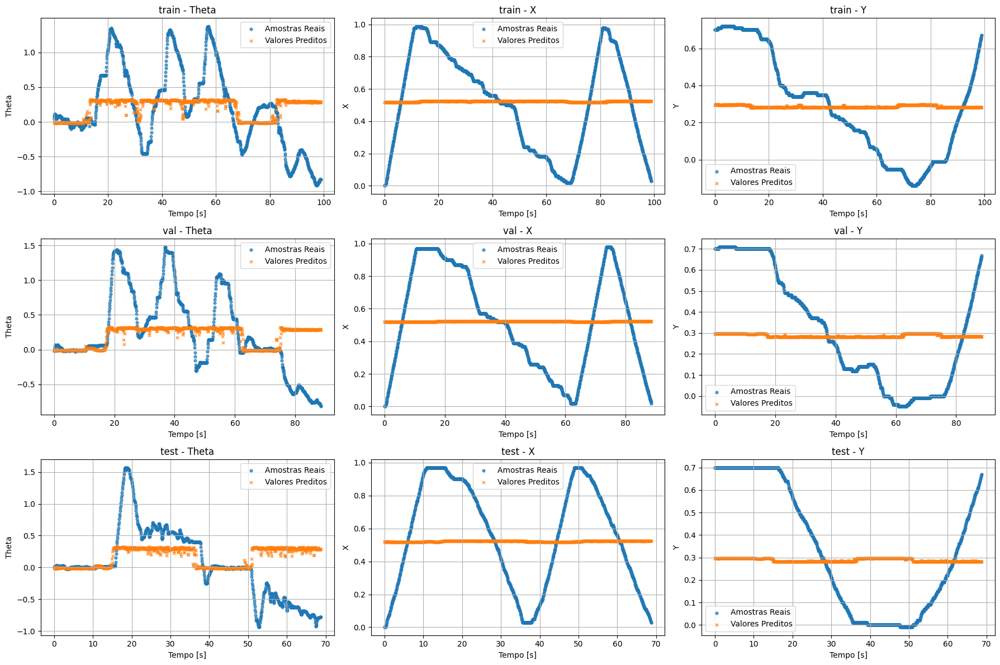

Modelo 9 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Theta | train -> R² = 0.0713, MSE = 3.0589e-01
X | train -> R² = 0.0104, MSE = 9.0668e-02
Y | train -> R² = 0.0770, MSE = 7.0706e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0810, MSE = 3.0136e-01
X | val -> R² = -0.0020, MSE = 9.5380e-02
Y | val -> R² = 0.0800, MSE = 6.8331e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.1461, MSE = 3.2877e-01
X | test -> R² = -0.0120, MSE = 1.0231e-01
Y | test -> R² = 0.0368, MSE = 7.6545e-02


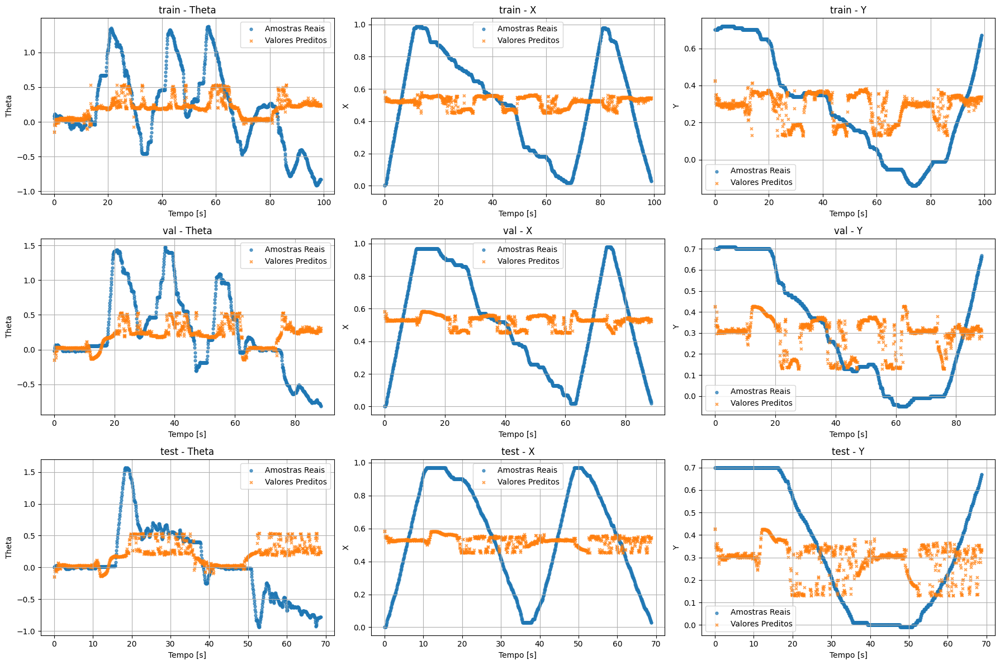

Modelo 0 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Theta | train -> R² = 0.0615, MSE = 3.0912e-01
X | train -> R² = 0.0130, MSE = 9.0428e-02
Y | train -> R² = 0.0270, MSE = 7.4537e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0553, MSE = 3.0978e-01
X | val -> R² = 0.0099, MSE = 9.4244e-02
Y | val -> R² = 0.0667, MSE = 6.9322e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0508, MSE = 3.0143e-01
X | test -> R² = 0.0228, MSE = 9.8786e-02
Y | test -> R² = 0.0834, MSE = 7.2842e-02


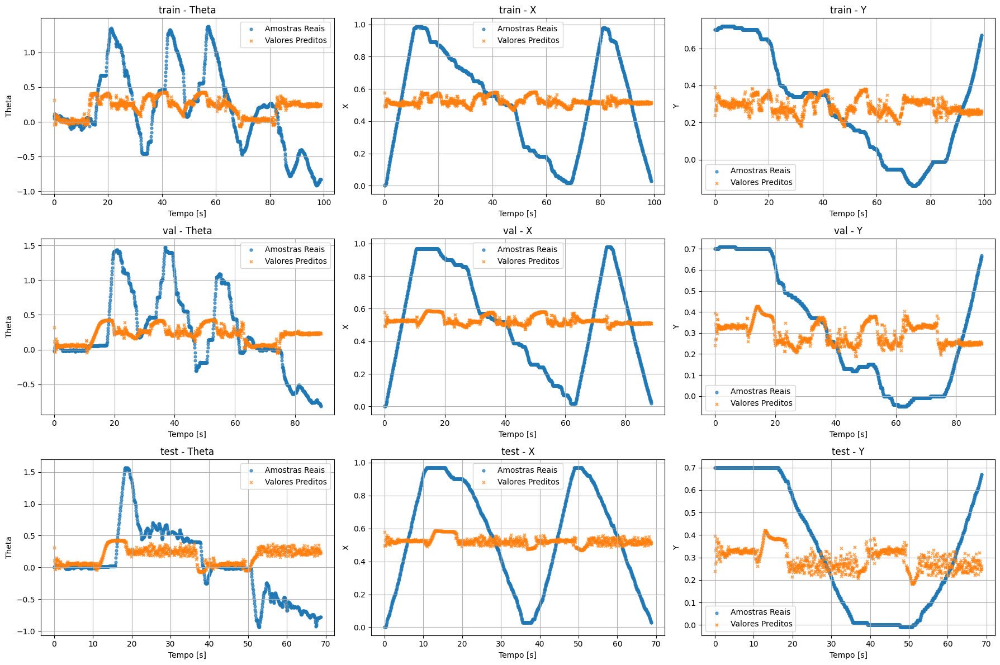

Modelo 1 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
Theta | train -> R² = 0.0668, MSE = 3.0736e-01
X | train -> R² = 0.0382, MSE = 8.8124e-02
Y | train -> R² = 0.0013, MSE = 7.6506e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Theta | val -> R² = 0.0819, MSE = 3.0105e-01
X | val -> R² = -0.0232, MSE = 9.7401e-02
Y | val -> R² = -0.0068, MSE = 7.4781e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0218, MSE = 2.9313e-01
X | test -> R² = -0.0070, MSE = 1.0180e-01
Y | test -> R² = -0.0289, MSE = 8.1764e-02


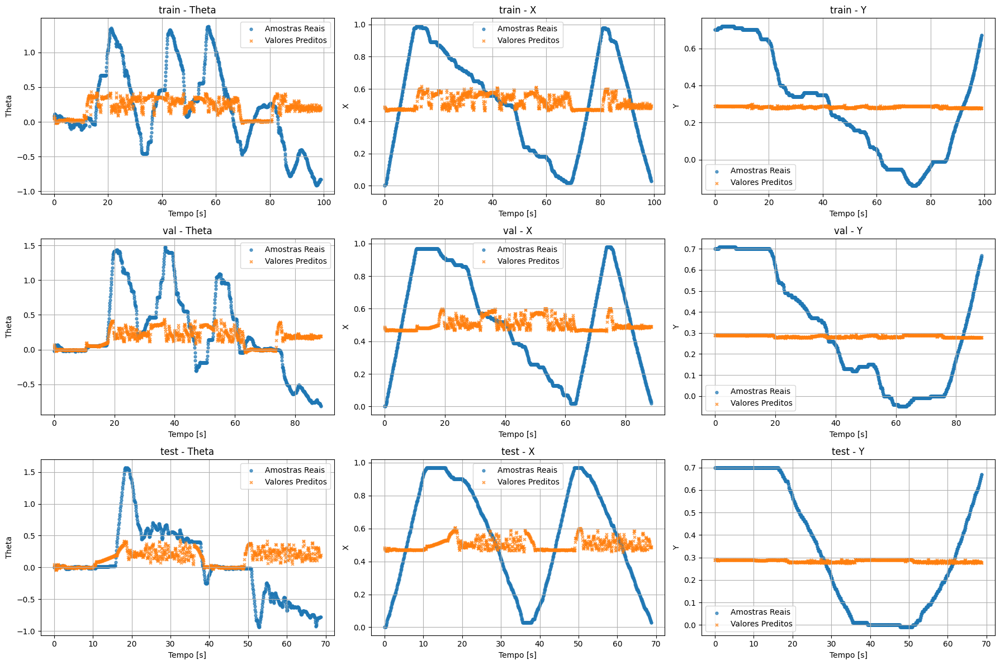

Modelo 2 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Theta | train -> R² = 0.1670, MSE = 2.7436e-01
X | train -> R² = 0.0499, MSE = 8.7051e-02
Y | train -> R² = 0.0608, MSE = 7.1946e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.1996, MSE = 2.6245e-01
X | val -> R² = -0.0408, MSE = 9.9075e-02
Y | val -> R² = 0.0201, MSE = 7.2782e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.2038, MSE = 3.4534e-01
X | test -> R² = -0.0421, MSE = 1.0535e-01
Y | test -> R² = -0.0457, MSE = 8.3102e-02


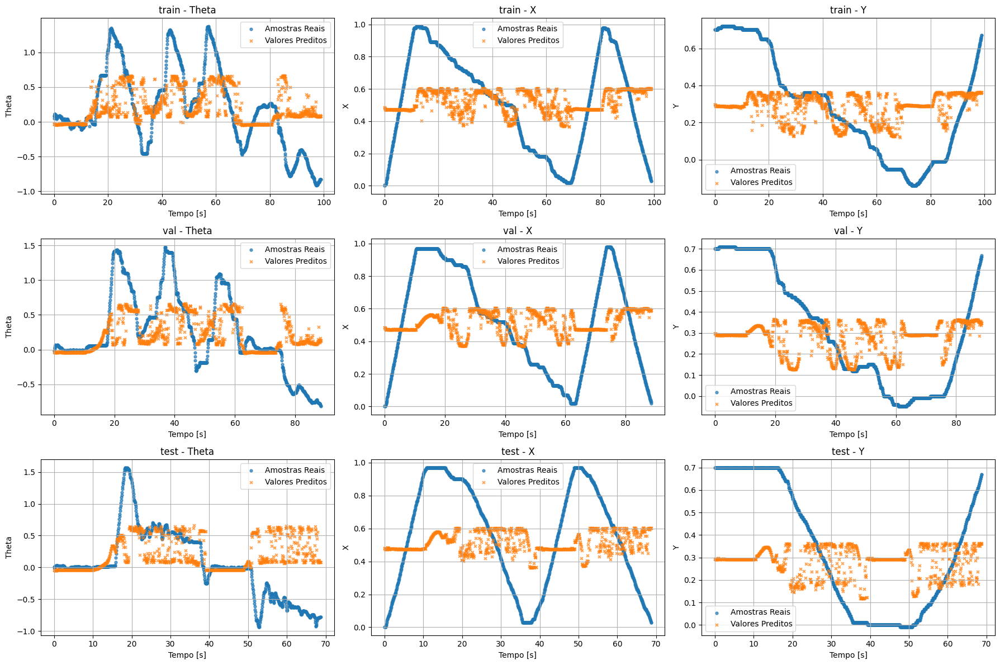

Modelo 3 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Theta | train -> R² = 0.0430, MSE = 3.1520e-01
X | train -> R² = 0.0544, MSE = 8.6637e-02
Y | train -> R² = 0.0326, MSE = 7.4112e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0637, MSE = 3.0701e-01
X | val -> R² = 0.0377, MSE = 9.1600e-02
Y | val -> R² = 0.0364, MSE = 7.1569e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0889, MSE = 3.1237e-01
X | test -> R² = 0.0517, MSE = 9.5864e-02
Y | test -> R² = 0.0257, MSE = 7.7425e-02


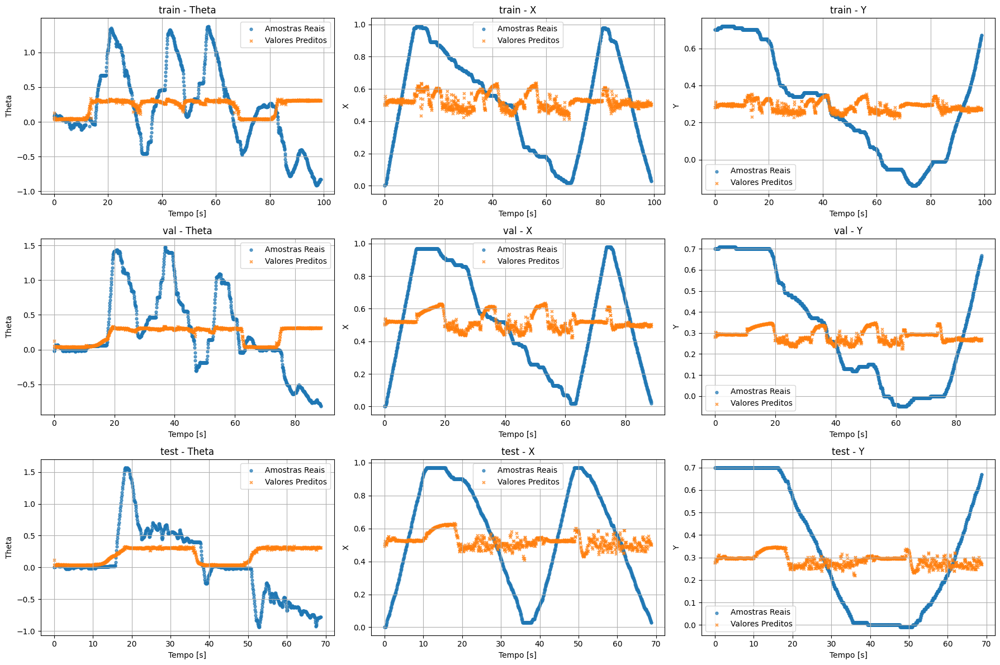

Modelo 4 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
Theta | train -> R² = 0.0490, MSE = 3.1324e-01
X | train -> R² = 0.0283, MSE = 8.9028e-02
Y | train -> R² = 0.0593, MSE = 7.2062e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0587, MSE = 3.0868e-01
X | val -> R² = -0.0051, MSE = 9.5671e-02
Y | val -> R² = 0.0626, MSE = 6.9626e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0856, MSE = 3.1144e-01
X | test -> R² = 0.0058, MSE = 1.0051e-01
Y | test -> R² = 0.0563, MSE = 7.4994e-02


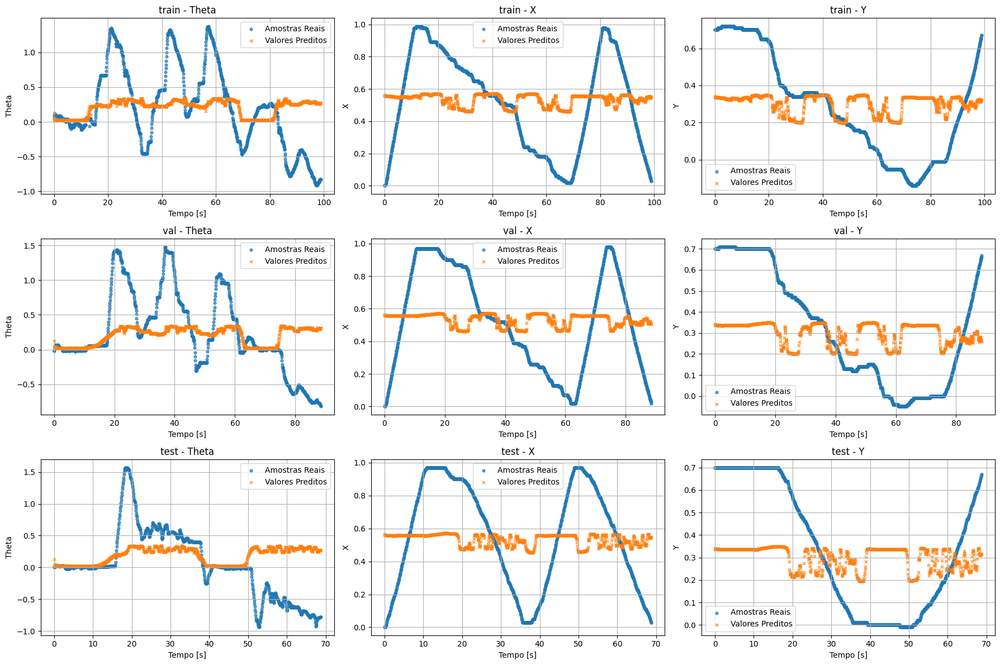

Modelo 5 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Theta | train -> R² = 0.0136, MSE = 3.2488e-01
X | train -> R² = 0.0254, MSE = 8.9299e-02
Y | train -> R² = 0.0505, MSE = 7.2741e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0178, MSE = 3.2208e-01
X | val -> R² = 0.0073, MSE = 9.4495e-02
Y | val -> R² = 0.0667, MSE = 6.9320e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0728, MSE = 3.0776e-01
X | test -> R² = 0.0113, MSE = 9.9948e-02
Y | test -> R² = 0.0679, MSE = 7.4075e-02


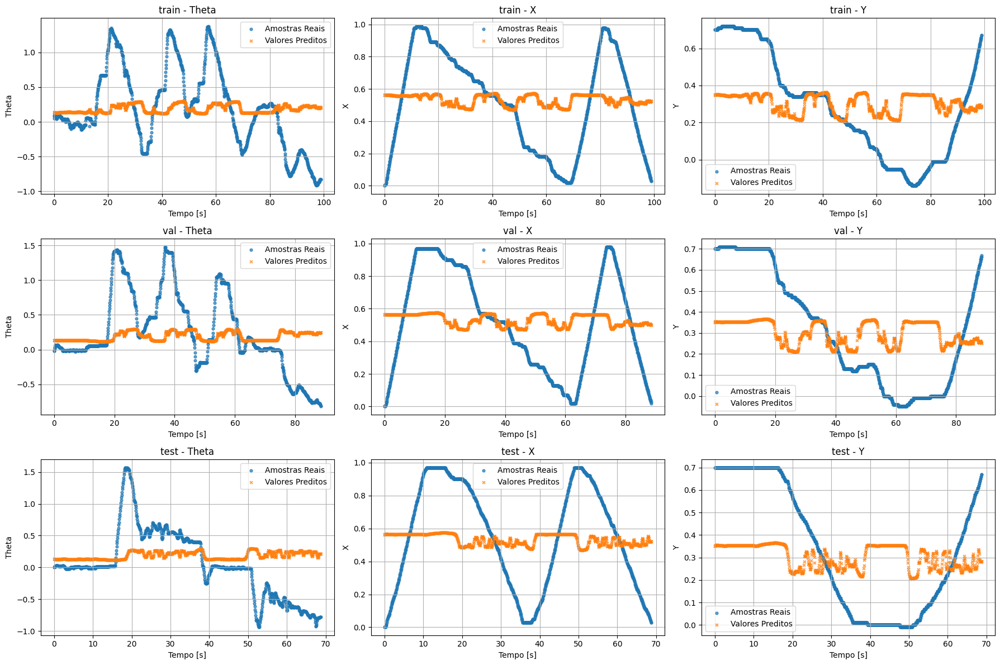

Modelo 6 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
Theta | train -> R² = 0.0370, MSE = 3.1719e-01
X | train -> R² = 0.0270, MSE = 8.9146e-02
Y | train -> R² = 0.0679, MSE = 7.1406e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0608, MSE = 3.0799e-01
X | val -> R² = -0.0287, MSE = 9.7924e-02
Y | val -> R² = 0.0611, MSE = 6.9738e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0943, MSE = 3.1392e-01
X | test -> R² = -0.0253, MSE = 1.0365e-01
Y | test -> R² = 0.0374, MSE = 7.6498e-02


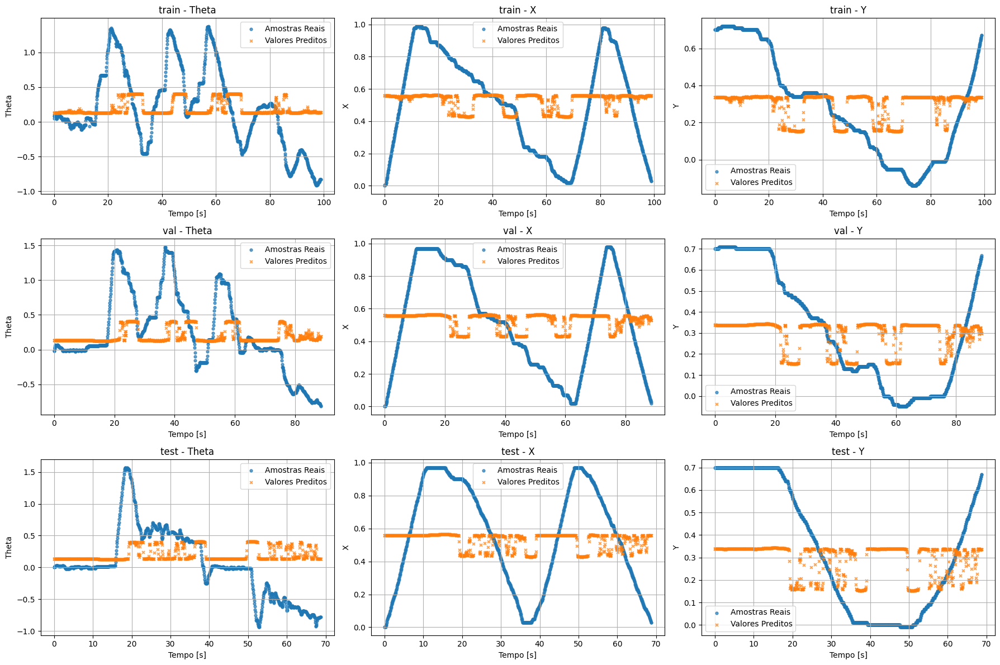

Modelo 7 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Theta | train -> R² = 0.0459, MSE = 3.1423e-01
X | train -> R² = 0.0225, MSE = 8.9565e-02
Y | train -> R² = 0.0361, MSE = 7.3839e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0566, MSE = 3.0934e-01
X | val -> R² = 0.0132, MSE = 9.3931e-02
Y | val -> R² = 0.0695, MSE = 6.9114e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0680, MSE = 3.0638e-01
X | test -> R² = 0.0275, MSE = 9.8309e-02
Y | test -> R² = 0.0714, MSE = 7.3795e-02


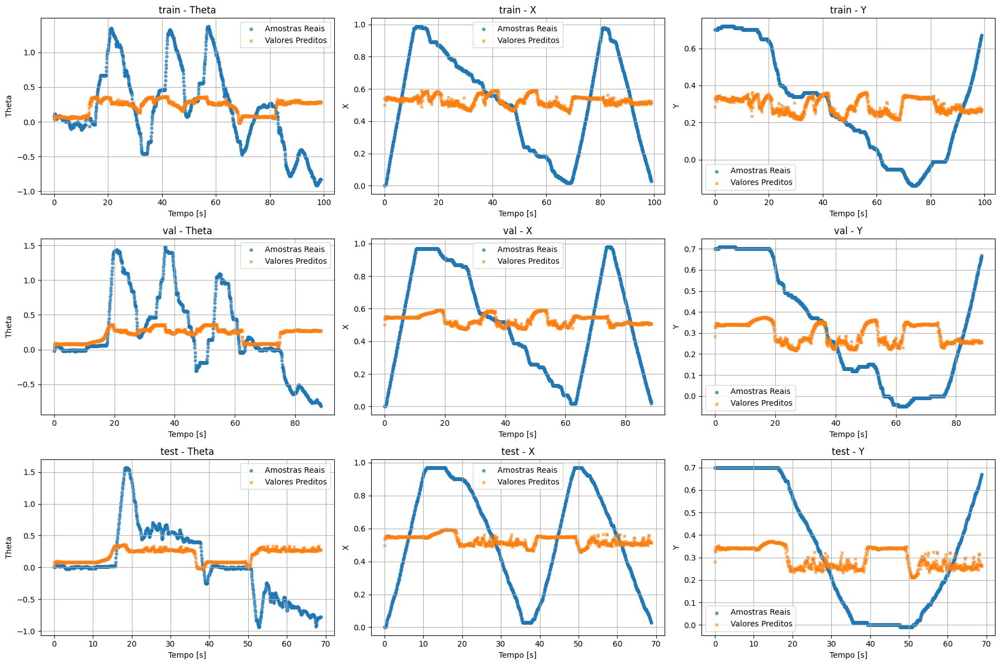

Modelo 8 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Theta | train -> R² = 0.0437, MSE = 3.1496e-01
X | train -> R² = 0.0277, MSE = 8.9079e-02
Y | train -> R² = 0.0406, MSE = 7.3496e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0532, MSE = 3.1047e-01
X | val -> R² = 0.0119, MSE = 9.4058e-02
Y | val -> R² = 0.0700, MSE = 6.9078e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0661, MSE = 3.0584e-01
X | test -> R² = 0.0208, MSE = 9.8988e-02
Y | test -> R² = 0.0688, MSE = 7.4005e-02


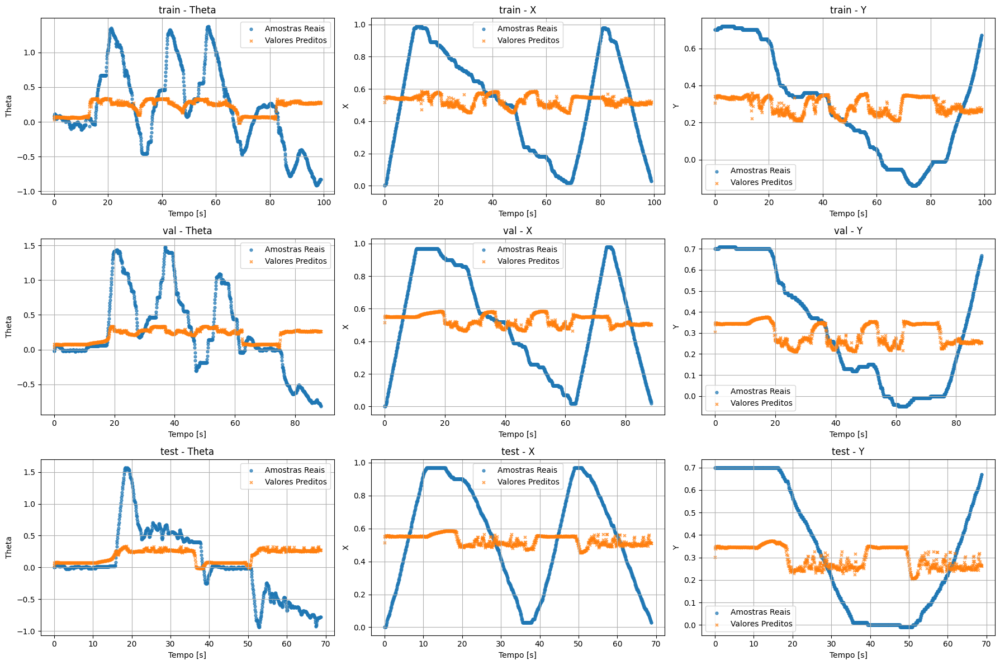

Modelo 9 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Theta | train -> R² = 0.0328, MSE = 3.1856e-01
X | train -> R² = 0.0283, MSE = 8.9033e-02
Y | train -> R² = 0.0238, MSE = 7.4782e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0512, MSE = 3.1112e-01
X | val -> R² = 0.0038, MSE = 9.4824e-02
Y | val -> R² = 0.0269, MSE = 7.2278e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.1011, MSE = 3.1588e-01
X | test -> R² = 0.0138, MSE = 9.9697e-02
Y | test -> R² = 0.0157, MSE = 7.8221e-02


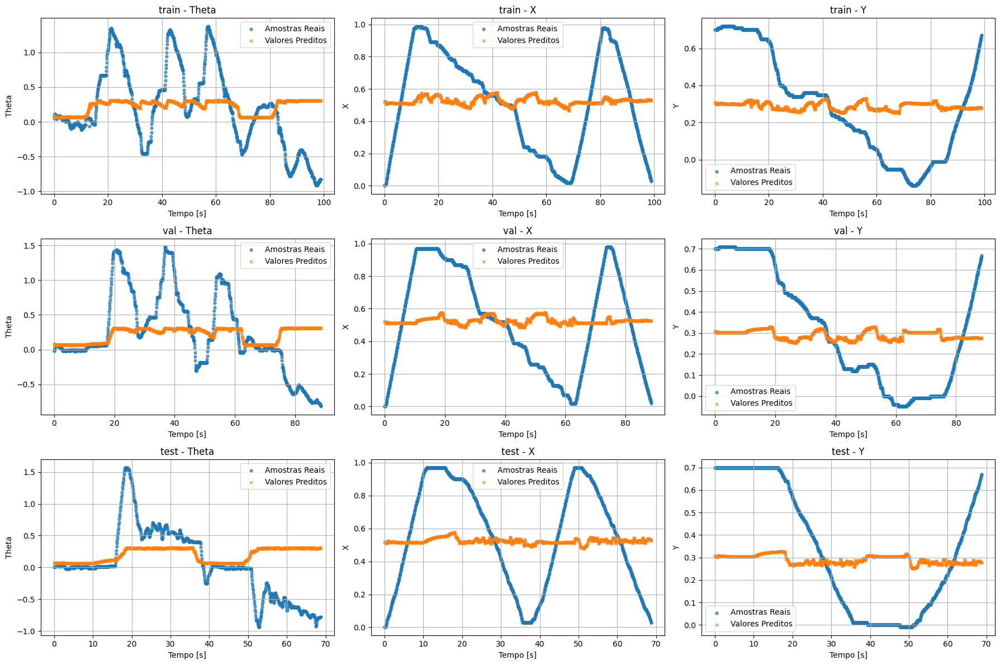

Modelo 0 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Theta | train -> R² = 0.0439, MSE = 3.1491e-01
X | train -> R² = 0.0316, MSE = 8.8728e-02
Y | train -> R² = 0.0369, MSE = 7.3779e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0483, MSE = 3.1206e-01
X | val -> R² = 0.0257, MSE = 9.2742e-02
Y | val -> R² = 0.0727, MSE = 6.8872e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0679, MSE = 3.0634e-01
X | test -> R² = 0.0337, MSE = 9.7690e-02
Y | test -> R² = 0.0752, MSE = 7.3492e-02


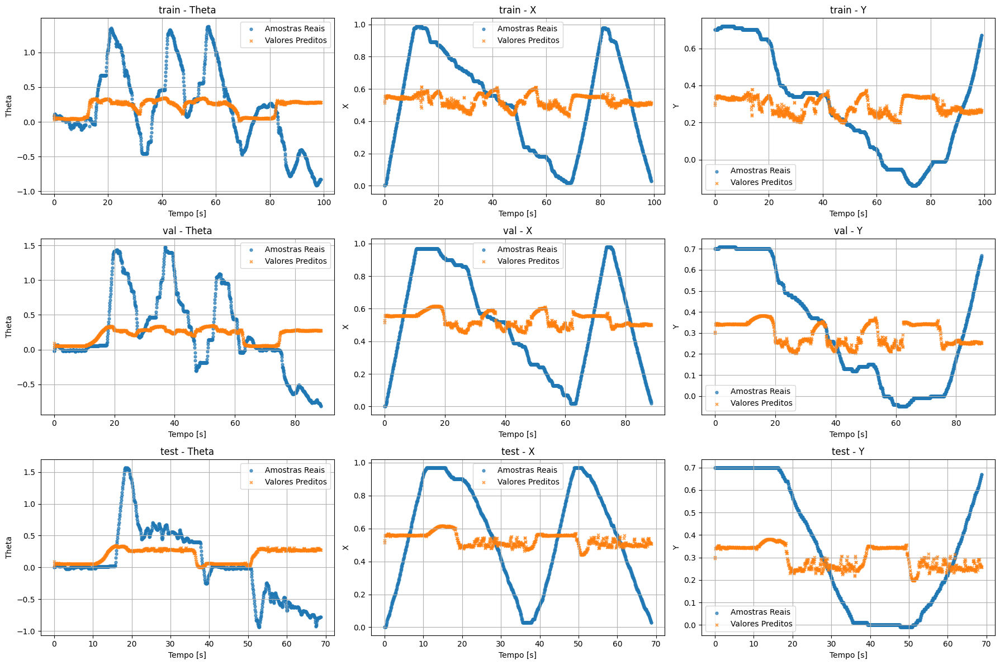

Modelo 1 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Theta | train -> R² = 0.1002, MSE = 2.9637e-01
X | train -> R² = 0.0223, MSE = 8.9576e-02
Y | train -> R² = 0.0838, MSE = 7.0185e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0785, MSE = 3.0218e-01
X | val -> R² = 0.0204, MSE = 9.3251e-02
Y | val -> R² = 0.0854, MSE = 6.7935e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.0727, MSE = 3.0773e-01
X | test -> R² = 0.0488, MSE = 9.6164e-02
Y | test -> R² = 0.0338, MSE = 7.6784e-02


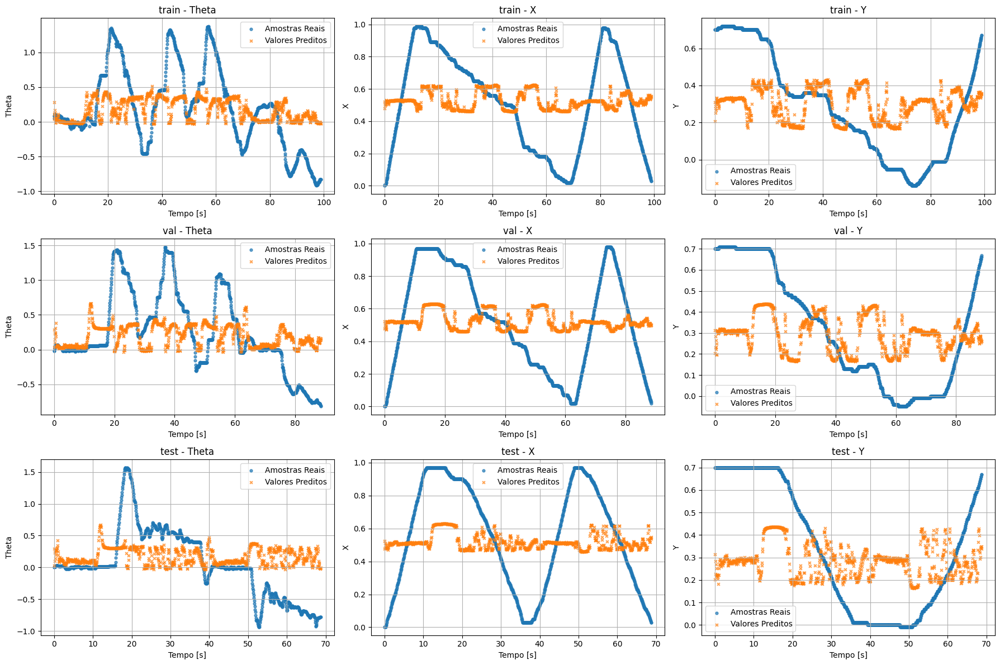

Modelo 2 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step
Theta | train -> R² = 0.0431, MSE = 3.1519e-01
X | train -> R² = 0.0251, MSE = 8.9325e-02
Y | train -> R² = 0.0382, MSE = 7.3685e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | val -> R² = 0.0521, MSE = 3.1083e-01
X | val -> R² = 0.0186, MSE = 9.3421e-02
Y | val -> R² = 0.0669, MSE = 6.9308e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0669, MSE = 3.0607e-01
X | test -> R² = 0.0301, MSE = 9.8045e-02
Y | test -> R² = 0.0752, MSE = 7.3493e-02


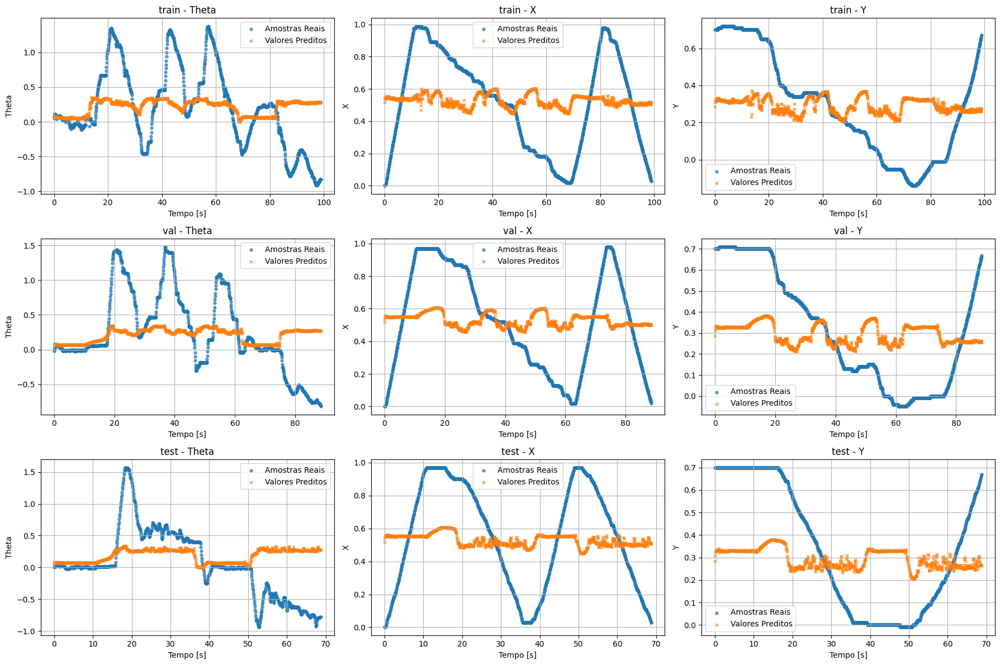

Modelo 3 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Theta | train -> R² = 0.1403, MSE = 2.8317e-01
X | train -> R² = 0.1301, MSE = 7.9701e-02
Y | train -> R² = 0.0889, MSE = 6.9800e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.1215, MSE = 2.8808e-01
X | val -> R² = 0.0856, MSE = 8.7039e-02
Y | val -> R² = 0.1153, MSE = 6.5708e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | test -> R² = -0.3259, MSE = 3.8035e-01
X | test -> R² = 0.0310, MSE = 9.7960e-02
Y | test -> R² = 0.0170, MSE = 7.8122e-02


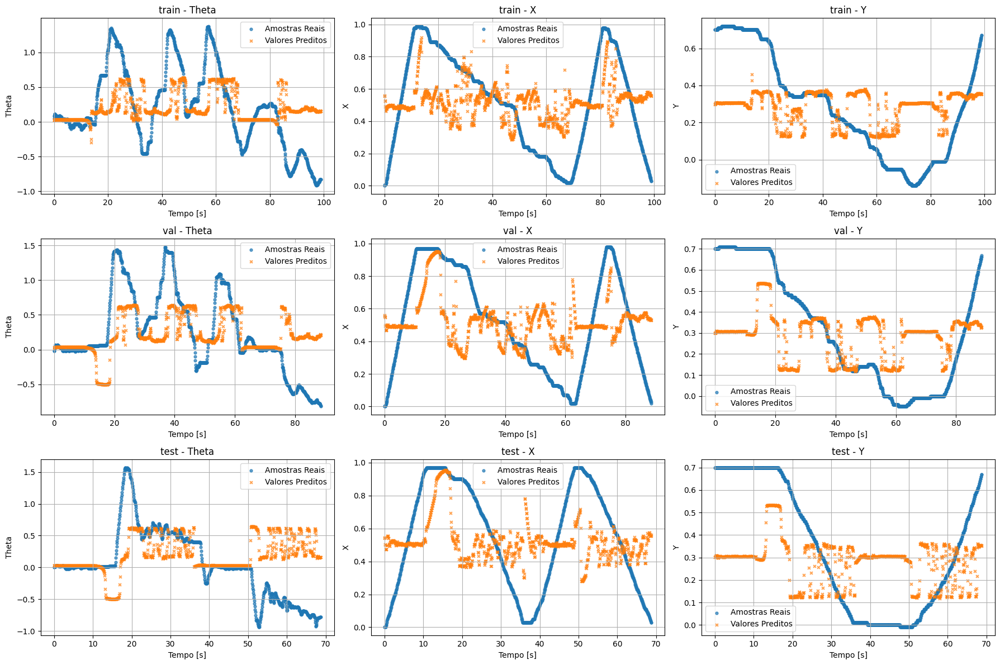

Modelo 4 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Theta | train -> R² = 0.0525, MSE = 3.1206e-01
X | train -> R² = 0.0079, MSE = 9.0899e-02
Y | train -> R² = 0.0460, MSE = 7.3087e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.0623, MSE = 3.0750e-01
X | val -> R² = -0.0020, MSE = 9.5379e-02
Y | val -> R² = 0.0466, MSE = 7.0814e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.0556, MSE = 3.0282e-01
X | test -> R² = -0.0046, MSE = 1.0156e-01
Y | test -> R² = 0.0731, MSE = 7.3658e-02


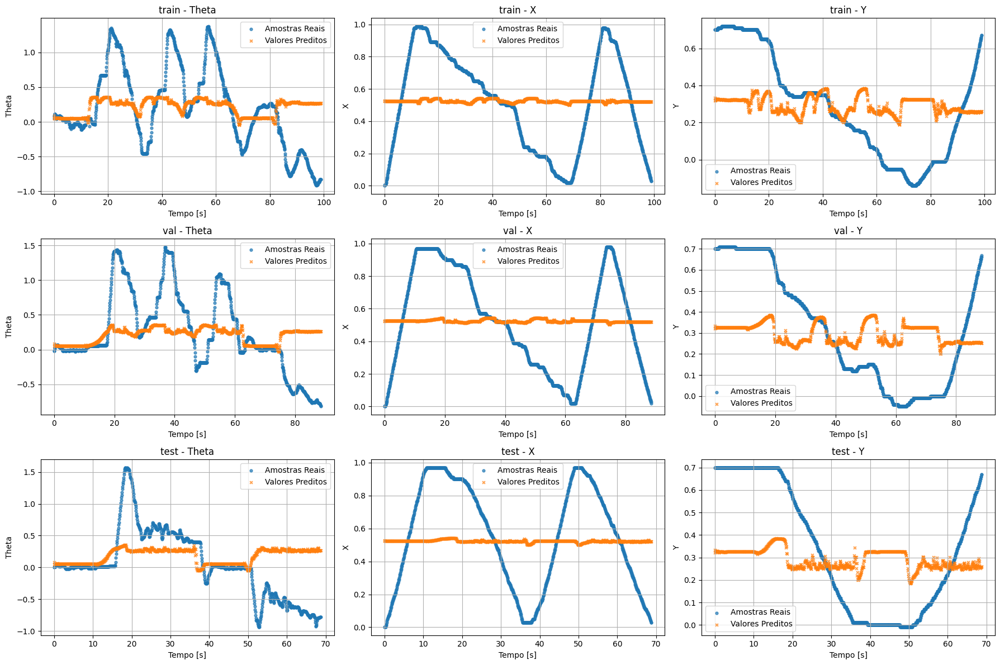

Modelo 5 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Theta | train -> R² = 0.0943, MSE = 2.9832e-01
X | train -> R² = 0.1057, MSE = 8.1941e-02
Y | train -> R² = 0.0757, MSE = 7.0805e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.1144, MSE = 2.9042e-01
X | val -> R² = 0.0396, MSE = 9.1420e-02
Y | val -> R² = 0.0953, MSE = 6.7196e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.1193, MSE = 3.2108e-01
X | test -> R² = 0.0481, MSE = 9.6231e-02
Y | test -> R² = 0.0558, MSE = 7.5035e-02


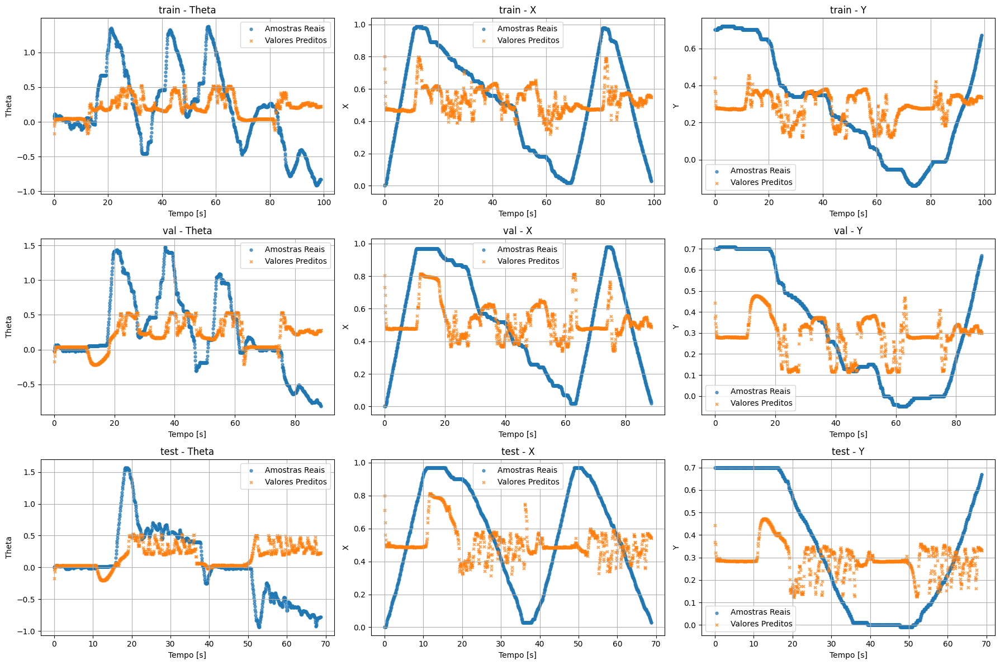

Modelo 6 treinado e salvo no Excel
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Theta | train -> R² = 0.2029, MSE = 2.6252e-01
X | train -> R² = 0.0706, MSE = 8.5151e-02
Y | train -> R² = 0.0673, MSE = 7.1452e-02
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Theta | val -> R² = 0.2638, MSE = 2.4140e-01
X | val -> R² = 0.0049, MSE = 9.4719e-02
Y | val -> R² = 0.0920, MSE = 6.7442e-02
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Theta | test -> R² = -0.1051, MSE = 3.1703e-01
X | test -> R² = 0.0354, MSE = 9.7515e-02
Y | test -> R² = 0.0257, MSE = 7.7426e-02


In [ ]:
import numpy as np
import pandas as pd
from tensorflow import keras
from keras.callbacks import EarlyStopping
from keras import initializers

# tamanho da entrada
INPUT_SIZE = len(PREDICTORS)  
OUTPUT_SIZE = len(TARGET) 
N_MODELS = 10  # número de inicializações

seeds = np.random.choice(range(1, 10000), size=N_MODELS, replace=False)
neurons = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 19, 20, 21, 22, 23, 24, 25]
results = {}
excel_file = "resultados.xlsx"

for n in neurons:
    for i, s in enumerate(seeds):

        initializer = initializers.RandomNormal(seed=int(s))

        # cria modelo
        model = keras.models.Sequential([
            keras.layers.Input(shape=(TIME_STEPS, INPUT_SIZE)),
            keras.layers.SimpleRNN(n, activation="tanh", kernel_initializer=initializer),
            keras.layers.Dense(OUTPUT_SIZE, activation="linear", kernel_initializer=initializer),  
        ])
        
        # salva pesos iniciais
        w0 = model.get_weights()

        # compila
        model.compile(loss="mean_squared_error", optimizer="adam")
        early_stopping_monitor = EarlyStopping(
            monitor='val_loss',
            patience=50,
            restore_best_weights=True
        )

        # treina
        history = model.fit(
            x_train, 
            y_train, 
            epochs=500,
            callbacks=[early_stopping_monitor],
            validation_data=(x_val, y_val),
            verbose=0
        )

        # salva pesos finais
        wf = model.get_weights()

       # avalia o modelo
        metrics = EvalModel(model)

        row = {
            "model": f"model_{n}_{i}",
            "Neurons": n,
            # ---- Pesos ----
            "W0": str([w.round(4).tolist() for w in w0]),
            "Wf": str([w.round(4).tolist() for w in wf]),
        }

        for name in TARGET:
            row.update({
                f"R2_Train_{name}": metrics[name]["R2_train"],
                f"MSE_Train_{name}": metrics[name]["MSE_train"],
                f"R2_Val_{name}": metrics[name]["R2_val"],
                f"MSE_Val_{name}": metrics[name]["MSE_val"],
                f"R2_Test_{name}": metrics[name]["R2_test"],
                f"MSE_Test_{name}": metrics[name]["MSE_test"],
            })

        df = pd.DataFrame([row])

        # salva/atualiza Excel incrementalmente
        try:
            # tenta abrir existente e adicionar linha
            old = pd.read_excel(excel_file)
            new_df = pd.concat([old, df], ignore_index=True)
            new_df.to_excel(excel_file, index=False)
        except FileNotFoundError:
            # se não existir, cria arquivo novo
            df.to_excel(excel_file, index=False)

        print(f"Modelo {i} treinado e salvo no Excel")